# Import Libraries

In [1]:
from tensorflow.python.keras import callbacks, optimizers
from tensorflow.python.keras.models import Model, load_model, model_from_json
from tensorflow.python.keras.preprocessing import image
from tensorflow.python.keras.layers import Input, Conv2D, MaxPooling2D, Activation, BatchNormalization, Conv2DTranspose, Concatenate
 
from tensorflow.keras.callbacks import ModelCheckpoint
import tensorflow as tf
from keras import backend as K
 
import numpy as np
import pandas as pd
import cv2
import os
import matplotlib.pyplot as plt
%matplotlib inline
 
K.set_image_data_format('channels_last')

# CPU Info

In [2]:
os.environ['CUDA-DEVICE_ORDER'] = 'PCI_BUS_ID'
os.environ['CUDA-VISIBLE_DEVICE'] = '0'
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
!nvidia-smi

Sat Jan 16 11:29:58 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.51.06    Driver Version: 450.51.06    CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Import Dataset

In [3]:
train_dir = '/kaggle/input/mitroad/tiff/train/'
mask_dir = '/kaggle/input/mitroad/tiff/train_labels/'
 
val_dir = '/kaggle/input/mitroad/tiff/val/'
v_mask_dir = '/kaggle/input/mitroad/tiff/val_labels/'

test_dir = '/kaggle/input/mitroad/tiff/test/'
t_mask_dir = '/kaggle/input/mitroad/tiff/test_labels/'

image_shape = (1024,1024)

# Showing Sample of training data

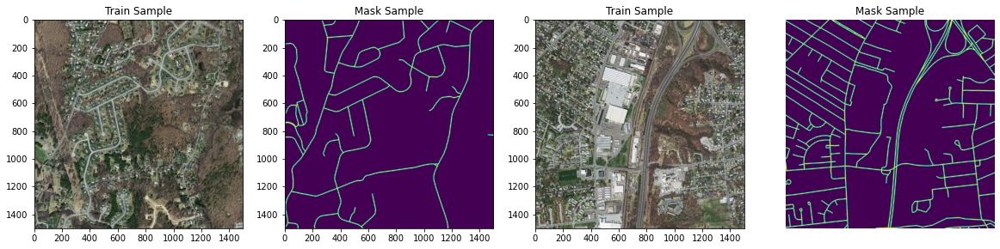

In [4]:
import matplotlib.image as mpimg 

def sample_show(a,b,c,d):  
  plt.figure(figsize=(20,17))
  plt.subplot(1,4,1)
  plt.title('Train Sample')
  plt.imshow(a)
  plt.subplot(1,4,2)
  plt.title('Mask Sample')
  plt.imshow(b)
  plt.subplot(1,4,3)
  plt.title('Train Sample')
  plt.imshow(c)
  plt.subplot(1,4,4)
  plt.title('Mask Sample')
  plt.imshow(d)  
  plt.axis('off')
  plt.show()    

train = mpimg.imread('/kaggle/input/mitroad/tiff/train/369.tiff')
mask  = mpimg.imread('/kaggle/input/mitroad/tiff/train_labels/369.tif')
train1 = mpimg.imread('/kaggle/input/mitroad/tiff/train/60.tiff')
mask1  = mpimg.imread('/kaggle/input/mitroad/tiff/train_labels/60.tif')

sample_show(train,mask,train1,mask1)

In [5]:
def preprocess_mask_image2(image, class_num, color_limit):
  pic = np.array(image)
  img = np.zeros((pic.shape[0], pic.shape[1], 1))  
  np.place(img[ :, :, 0], pic[ :, :, 0] >= color_limit, 1)  
  return img

# custom Loss Function define

In [6]:
def dice_coef(y_true, y_pred):

    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1.0) 
 
def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

# Preparing Train Image data

In [7]:
def train_generator(img_dir, label_dir, batch_size, input_size):
    list_images = os.listdir(label_dir)
    # shuffle(list_images) #Randomize the choice of batches
    ids_train_split = range(len(list_images))

    while True:
         for start in range(0, len(ids_train_split), batch_size):
            x_batch = []
            y_batch = []

            end = min(start + batch_size, len(ids_train_split))
            ids_train_batch = ids_train_split[start:end]

            for id in ids_train_batch:
              img_name = img_dir + list_images[id]+'f'
              mask_name = label_dir + list_images[id]
  
              img = cv2.imread(img_name) 
              img  = cv2.resize(img, image_shape, interpolation=cv2.INTER_AREA)
  
              mask = cv2.imread(mask_name)
              mask = cv2.resize(mask, image_shape, interpolation=cv2.INTER_AREA)
              mask = preprocess_mask_image2(mask, 2, 50)                
              
              x_batch += [img]
              y_batch += [mask]    

    
            x_batch = np.array(x_batch) / 255.
            y_batch = np.array(y_batch) 

            yield x_batch, np.expand_dims(y_batch, -1)

# Creating Unet Model

In [8]:
def unet(num_classes = 1, input_shape= (image_shape[0],image_shape[1], 3)):
  inp = Input(input_shape)
  # Block 1
  x = Conv2D(64, (3, 3), padding='same', name='block1_conv1')(inp)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(64, (3, 3), padding='same', name='block1_conv2')(x)
  x = BatchNormalization()(x)
  block_1_out = Activation('relu')(x)
  x = MaxPooling2D()(block_1_out)
  # Block 2
  x = Conv2D(128, (3, 3), padding='same', name='block2_conv1')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(128, (3, 3), padding='same', name='block2_conv2')(x)
  x = BatchNormalization()(x)
  block_2_out = Activation('relu')(x)
  x = MaxPooling2D()(block_2_out)
  # Block 3
  x = Conv2D(256, (3, 3), padding='same', name='block3_conv1')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(256, (3, 3), padding='same', name='block3_conv2')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(256, (3, 3), padding='same', name='block3_conv3')(x)
  x = BatchNormalization()(x)
  block_3_out = Activation('relu')(x)
  x = MaxPooling2D()(block_3_out)
  # Block 4
  x = Conv2D(512, (3, 3), padding='same', name='block4_conv1')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(512, (3, 3), padding='same', name='block4_conv2')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(512, (3, 3), padding='same', name='block4_conv3')(x)
  x = BatchNormalization()(x)
  block_4_out = Activation('relu')(x)
  
 
  
  x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same', name = 'Conv2DTranspose_UP2')(block_4_out)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Concatenate()([x, block_3_out])
  x = Conv2D(256, (3, 3), padding='same')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(256, (3, 3), padding='same')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  # UP 3
  x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same', name = 'Conv2DTranspose_UP3')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Concatenate()([x, block_2_out])
  x = Conv2D(128, (3, 3), padding='same')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(128, (3, 3), padding='same')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  # UP 4
  x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same', name = 'Conv2DTranspose_UP4')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Concatenate()([x, block_1_out])
  x = Conv2D(64, (3, 3), padding='same')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(64, (3, 3), padding='same')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(num_classes, (3, 3), activation='sigmoid', padding='same')(x)
 
  model = Model(inputs=inp, outputs=x)
  adam = tf.keras.optimizers.Adam(lr=0.0001)
  model.compile(optimizer=adam,
                  loss=dice_coef_loss,
                  metrics=[dice_coef])
  return model

# Training and Saving the Model


In [9]:
model = unet() 
 
batch_size = 2
history = model.fit_generator(train_generator(train_dir, mask_dir, batch_size, image_shape),                              
                              steps_per_epoch=554,
                              epochs=14,
                              verbose=1,
                              validation_data=train_generator(val_dir, v_mask_dir, batch_size, image_shape),
                              validation_steps=1,
                              class_weight=None,
                              max_queue_size=10,
                              workers=1
                              )

Epoch 1/14
554/554 [==============================] - 553s 997ms/step - loss: 0.5055 - dice_coef: 0.4945 - val_loss: 0.4511 - val_dice_coef: 0.5489
Epoch 2/14
554/554 [==============================] - 554s 999ms/step - loss: 0.3601 - dice_coef: 0.6399 - val_loss: 0.2355 - val_dice_coef: 0.7645
Epoch 3/14
554/554 [==============================] - 554s 1000ms/step - loss: 0.3348 - dice_coef: 0.6652 - val_loss: 0.2620 - val_dice_coef: 0.7380
Epoch 4/14
554/554 [==============================] - 554s 1000ms/step - loss: 0.3226 - dice_coef: 0.6774 - val_loss: 0.3027 - val_dice_coef: 0.6973
Epoch 5/14
554/554 [==============================] - 554s 999ms/step - loss: 0.3149 - dice_coef: 0.6851 - val_loss: 0.2649 - val_dice_coef: 0.7351
Epoch 6/14
554/554 [==============================] - 554s 999ms/step - loss: 0.3089 - dice_coef: 0.6911 - val_loss: 0.2252 - val_dice_coef: 0.7748
Epoch 7/14
554/554 [==============================] - 554s 999ms/step - loss: 0.3022 - dice_coef: 0.6978 - val

In [10]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 1024, 1024,  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 1024, 1024, 6 1792        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 1024, 1024, 6 256         block1_conv1[0][0]               
__________________________________________________________________________________________________
activation (Activation)         (None, 1024, 1024, 6 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [11]:
model.save_weights('/kaggle/working/road_mapper_final.h5')

# prepare test image


In [12]:
def prepare_test_image(image):    
  x_batch = []   
  # img = cv2.imread(image_path)  
  img  = cv2.resize(image, image_shape, interpolation=cv2.INTER_AREA)
  x_batch += [img]           
  x_batch = np.array(x_batch) / 255.        

  return x_batch



In [13]:
def binaryImage(image):
  x = image.shape[1]
  y = image.shape[2]
  imgs = np.zeros((x,y,3))
  for k in range(x):
    for n in range(y):
      if image[0,k,n]>0.5:
        imgs[k,n,0]=255
        imgs[k,n,1]=255
        imgs[k,n,2]=255
        # print(imgs[k,n])
      # else:
      #   imgs[k,n]=0
  return imgs 


# Showing Output

In [14]:
def draw(orig_im, mask_im, recogn_im, out_im):  
  plt.figure(figsize=(20,17))
  plt.subplot(1,4,1)
  plt.title('Satelite Image')
  plt.imshow(orig_im)
  plt.subplot(1,4,2)
  plt.title('Ground Truth')
  plt.imshow(mask_im)
  plt.subplot(1,4,3)
  plt.title('Recognize Roads')
  plt.imshow(recogn_im)
  plt.subplot(1,4,4)
  plt.title('Final Output')
  plt.imshow(out_im)
  plt.axis('off')
  plt.show()


In [15]:

def recogn_test_image():
  test_images = os.listdir(t_mask_dir)

  for test in test_images:
    im_test = cv2.imread(test_dir+test+'f')
    im_mask = cv2.imread(t_mask_dir+test)
    out_test = model.predict(prepare_test_image(im_test), verbose=0)
    img_r = binaryImage(out_test)
    draw(im_test, im_mask, img_r ,out_test[0,:, :, 0]*255) 

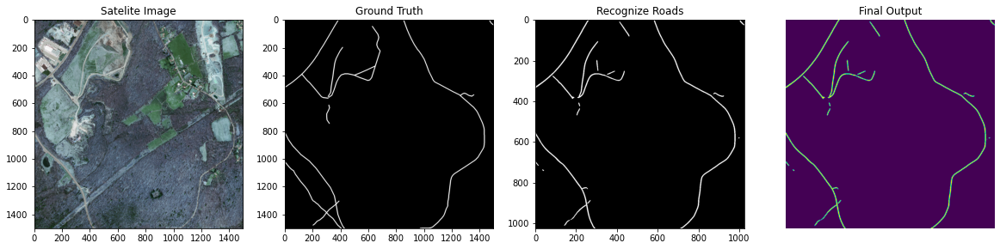

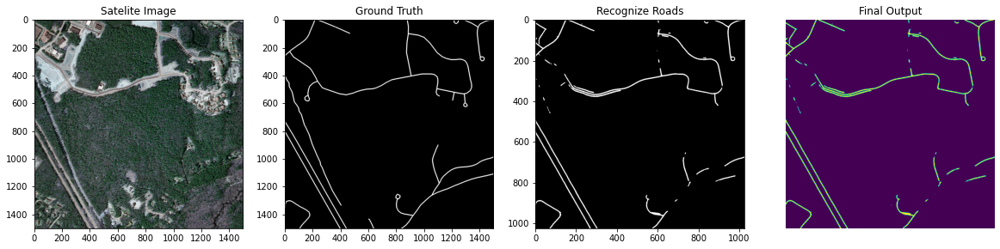

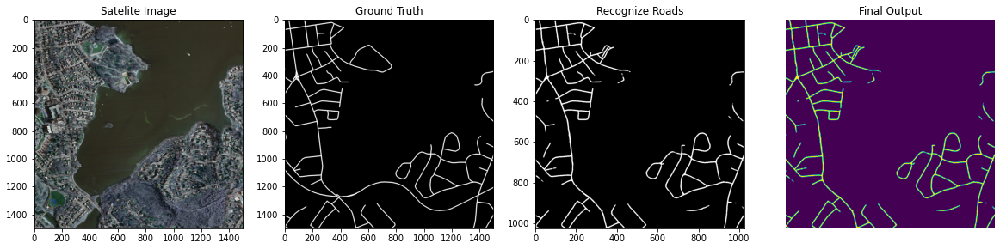

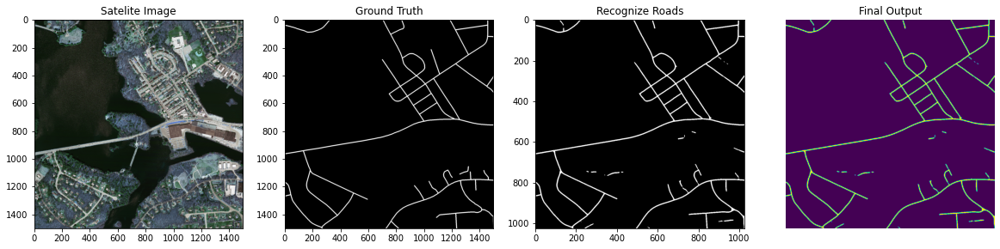

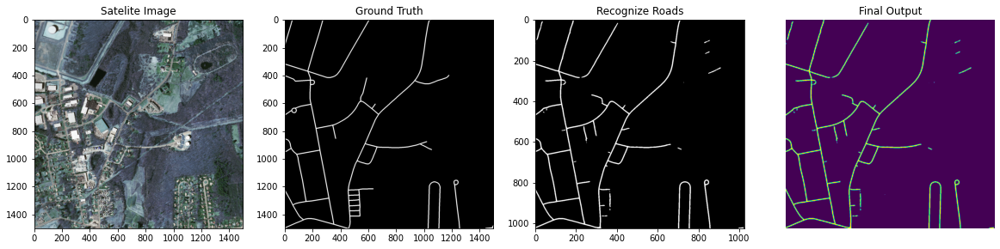

...

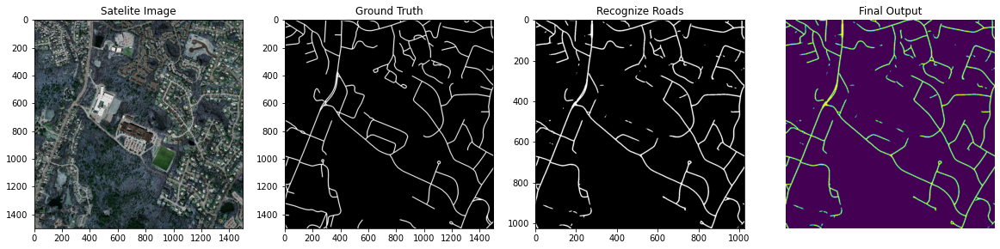

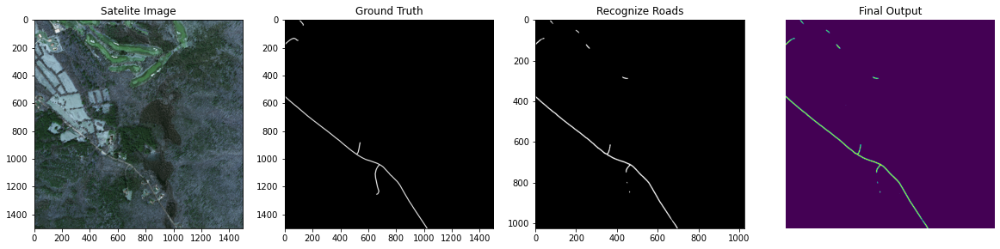

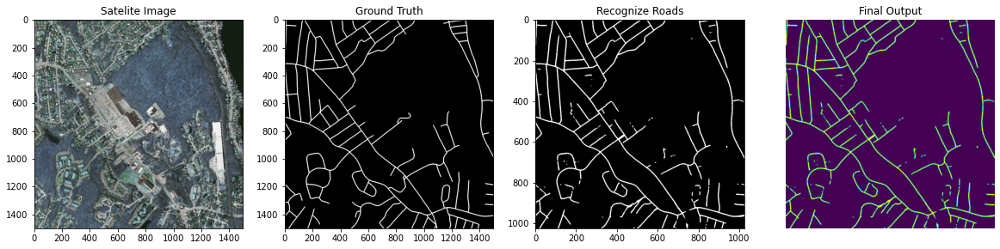

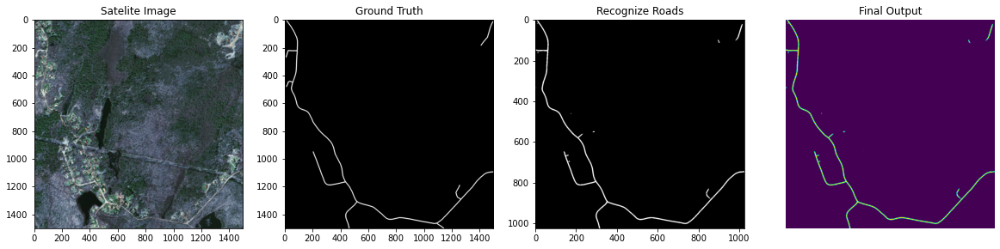

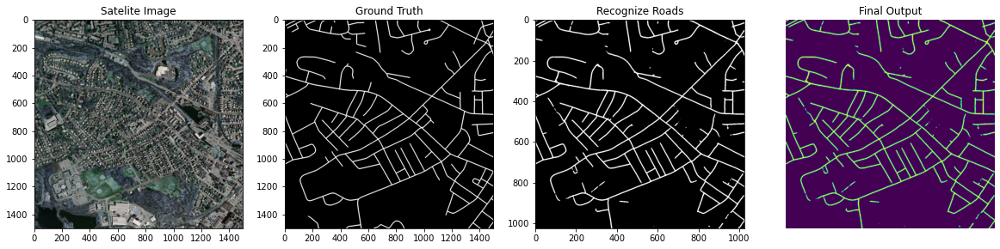

In [16]:
recogn_test_image()

# plotting loss funcions

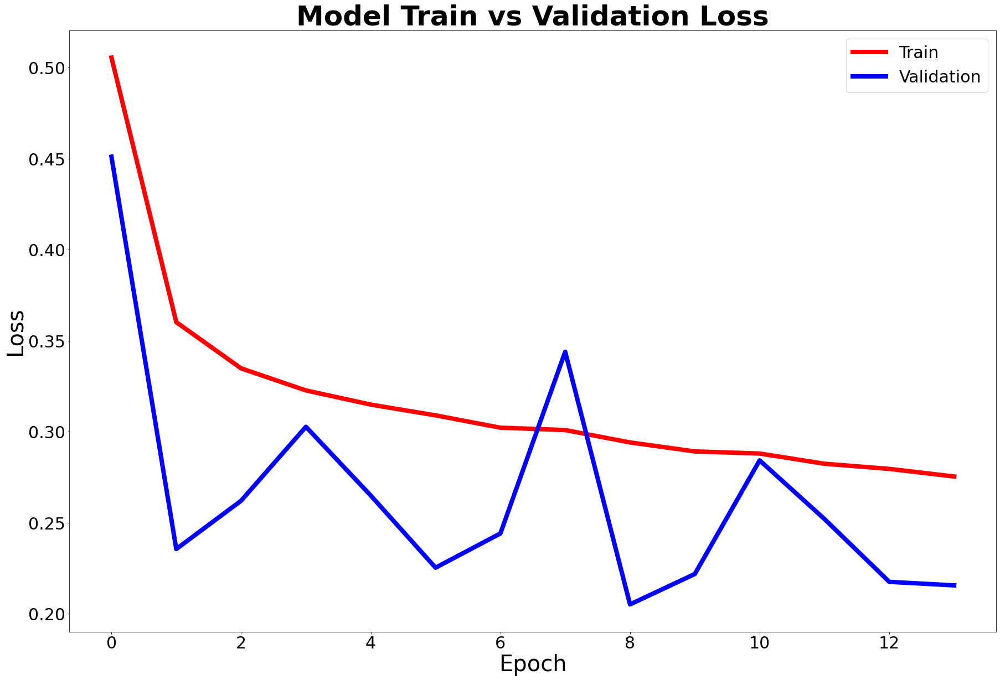

In [23]:
plt.figure(figsize=(30, 20))
plt.plot(history.history['loss'], linewidth=8, color='r')               
plt.plot(history.history['val_loss'], linewidth=8, color='b')
plt.title('Model Train vs Validation Loss', fontsize=50, fontweight="bold")
plt.ylabel('Loss', fontsize=40)
plt.xlabel('Epoch', fontsize=40)
plt.legend(['Train', 'Validation'], loc='upper right', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()